In [11]:
import torch
import torch.nn as nn
import numpy as np
import os
from wholeslidedata.iterators import create_batch_iterator
from tqdm import tqdm
import segmentation_models_pytorch as smp
import sys
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
sys.path.insert(1, os.path.join(sys.path[0], '..'))
from utils import print_dataset_statistics, plot_pred_batch, load_config, plot_batch
from preprocessing import get_preprocessing, to_dysplastic_vs_non_dysplastic, tissue_mask_batch

In [12]:
def plot_tissue_masked_batch(x, y, y_m, patches=4):
    """ Plots the normal batch vs the tissue masked one.
    """
    patches = min(len(x), patches)

    green_patch = mpatches.Patch(color='green', label='NDBE', alpha=0.5)
    red_patch = mpatches.Patch(color='red', label='LGD/HGD', alpha=0.5)

    # show just the image
    fig, axes = plt.subplots(3, patches, figsize=(15, 10), squeeze=False)
    plt.legend(handles=[green_patch, red_patch], bbox_to_anchor=(1.05, 1.0), loc='upper left', borderaxespad=0.,  prop={'size': 10})
    plot_batch(axes, 0, x[:patches], np.zeros_like(y)[:patches], alpha=0.3, colors=colors_2)
    plot_batch(axes, 1, x[:patches], y[:patches], alpha=0.3, colors=colors_2)
    plot_batch(axes, 2, x[:patches], y_m[:patches], alpha=0.3, colors=colors_2)
    plt.tight_layout()
    plt.show()

In [2]:
# define some colors
colors_1 = ["white", "green", "orange", "red", 'yellow', 'yellow', 'purple', 'pink', 'grey', "blue"]
colors_2 = ["white", "green", "red", "yellow", 'brown', 'yellow', 'purple', 'pink', 'grey', 'green']

In [3]:
# config path
base_dir = '/home/mbotros/code/barrett_gland_grading/'
user_config = os.path.join(base_dir, 'configs/base_config.yml')

In [4]:
# load network config and store in experiment dir
print('Loaded config: {}'.format(user_config))
wholeslide_config, train_config = load_config(user_config)

# create train and validation generators (no reset)
training_batch_generator = create_batch_iterator(user_config=user_config,
                                                 mode='training',
                                                 cpus=train_config['cpus'])

validation_batch_generator = create_batch_iterator(mode='validation',
                                                   user_config=user_config,
                                                   cpus=train_config['cpus'])

print('\nTraining dataset ')
train_data_dict = print_dataset_statistics(training_batch_generator.dataset)
print('\nValidation dataset ')
val_data_dict = print_dataset_statistics(validation_batch_generator.dataset)
print('')

Loaded config: /home/mbotros/code/barrett_gland_grading/configs/base_config.yml

Training dataset 
Annotation level: {'hgd-g': 4110, 'lgd-g': 4656, 'ndbe-g': 28819}
Pixel level: {'hgd-g': 1572591644, 'lgd-g': 1698877634, 'ndbe-g': 9724281016}
Pixel percentage per class: {'hgd-g': 12.1, 'lgd-g': 13.07, 'ndbe-g': 74.83}

Validation dataset 
Annotation level: {'hgd-g': 517, 'lgd-g': 471, 'ndbe-g': 3680}
Pixel level: {'hgd-g': 214612947, 'lgd-g': 174391424, 'ndbe-g': 1433875207}
Pixel percentage per class: {'hgd-g': 11.77, 'lgd-g': 9.57, 'ndbe-g': 78.66}



In [5]:
# lets get some batches (validation)
nr_batches = 10
batches = []
    
for idx in tqdm(range(nr_batches)) :
    x, y, info = next(training_batch_generator)
    batches.append((x, y))

100%|████████████████████████████████████████████████████████████████████████████████████████| 10/10 [02:22<00:00, 14.29s/it]


### Mask out non Tissue

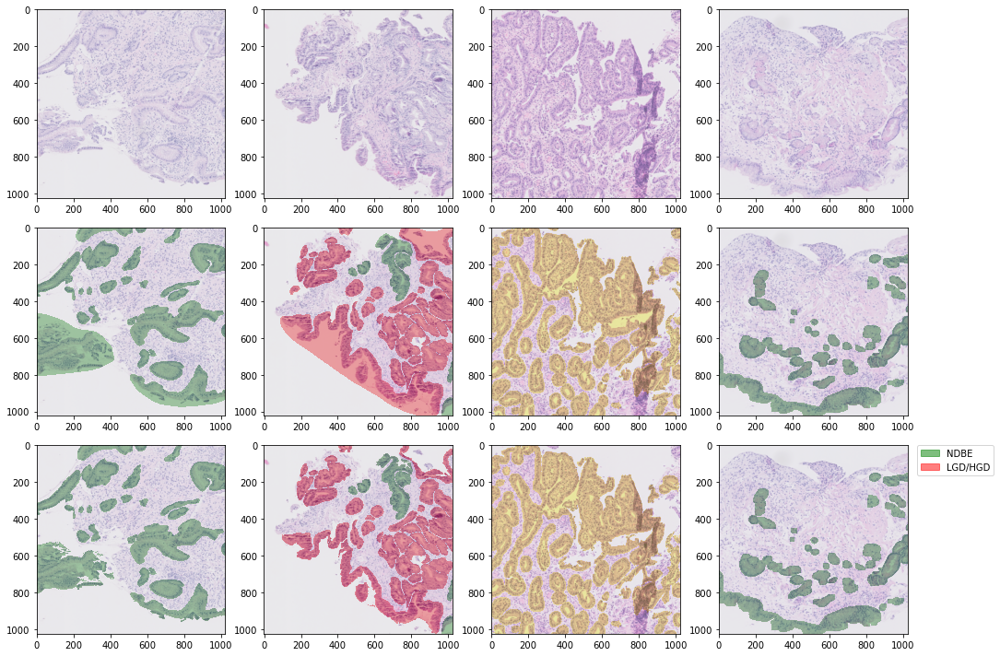

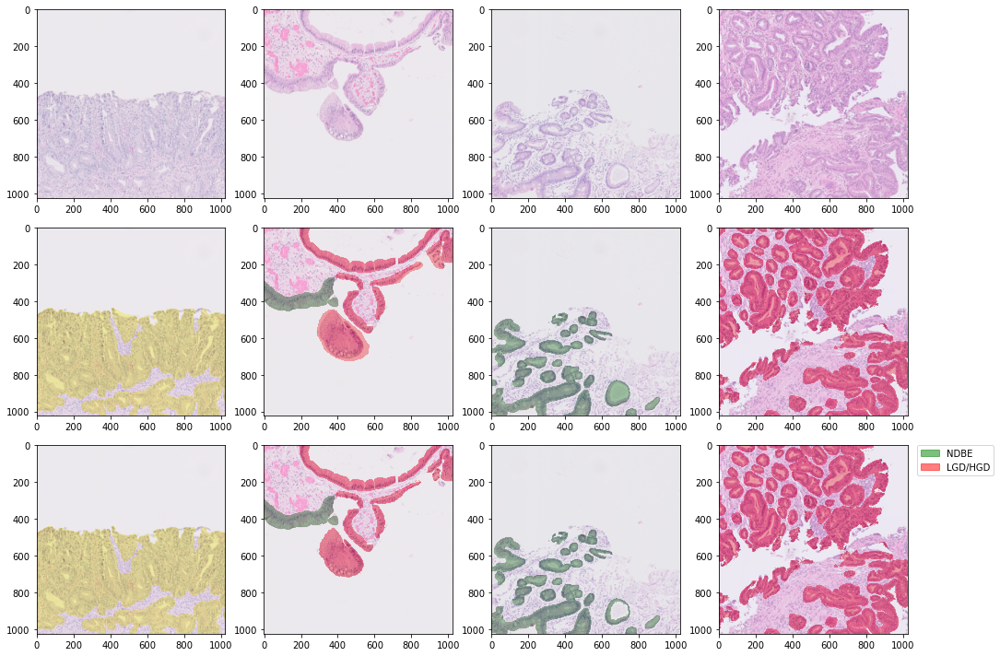

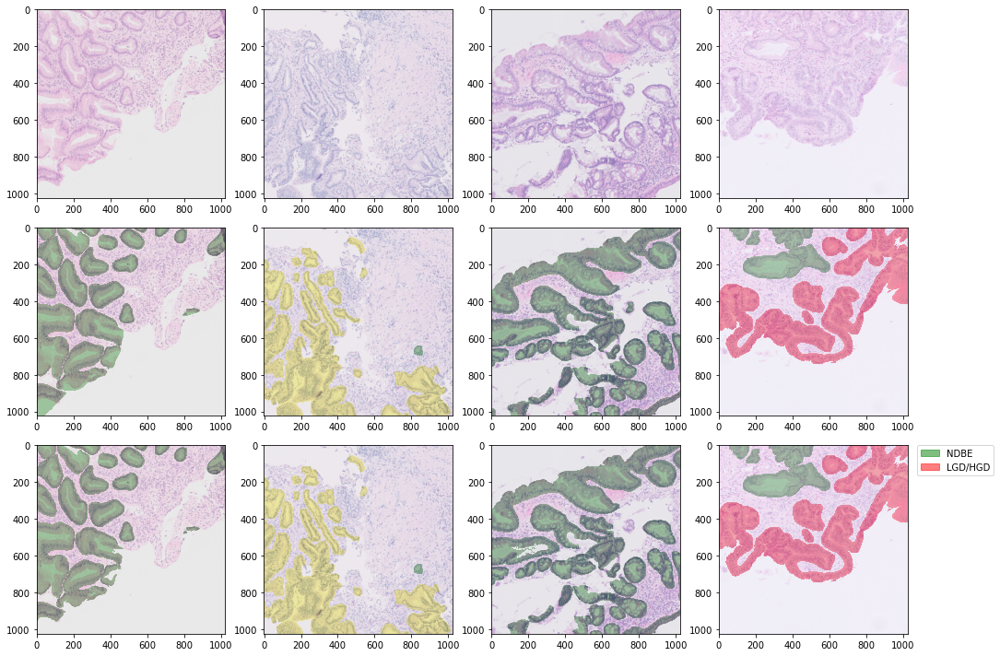

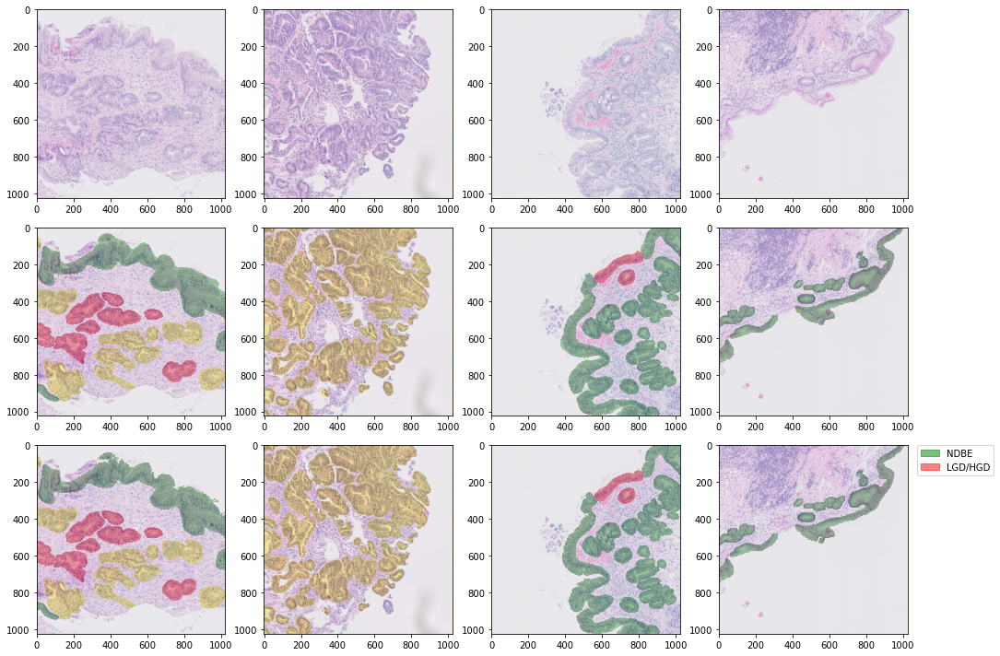

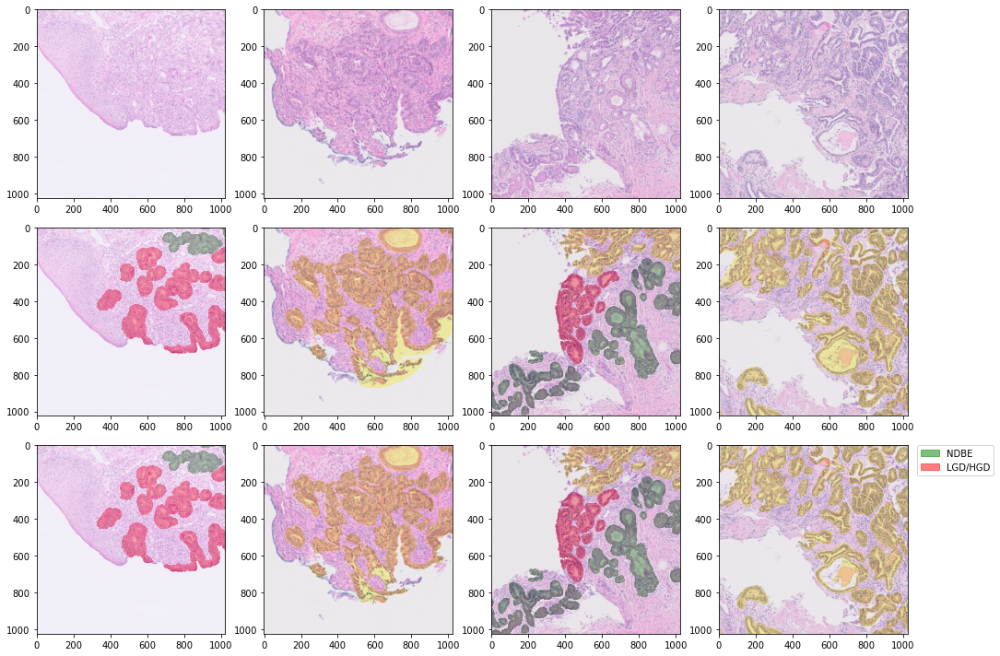

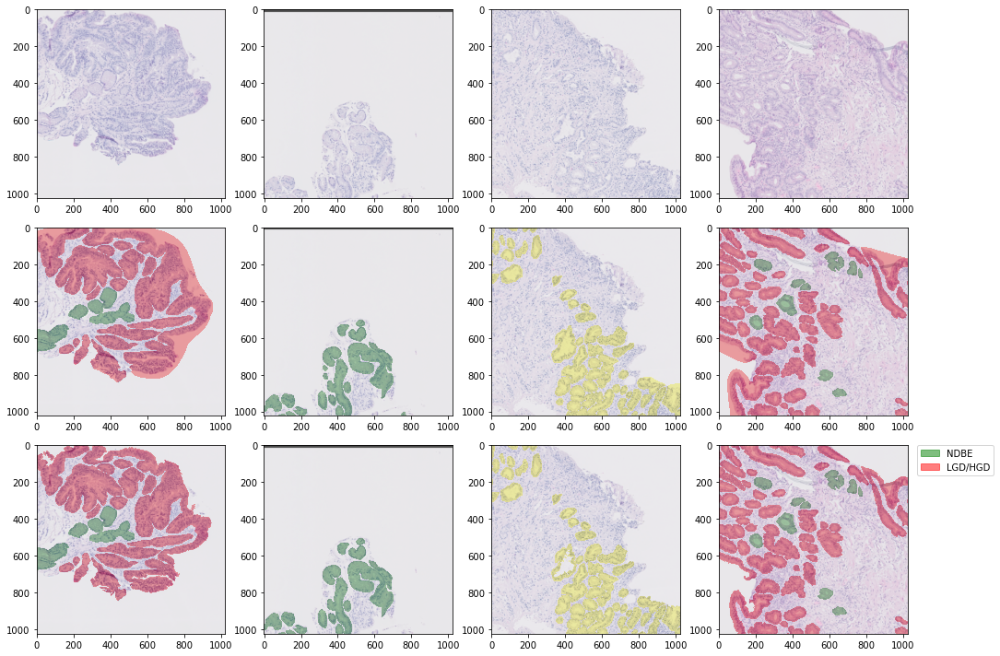

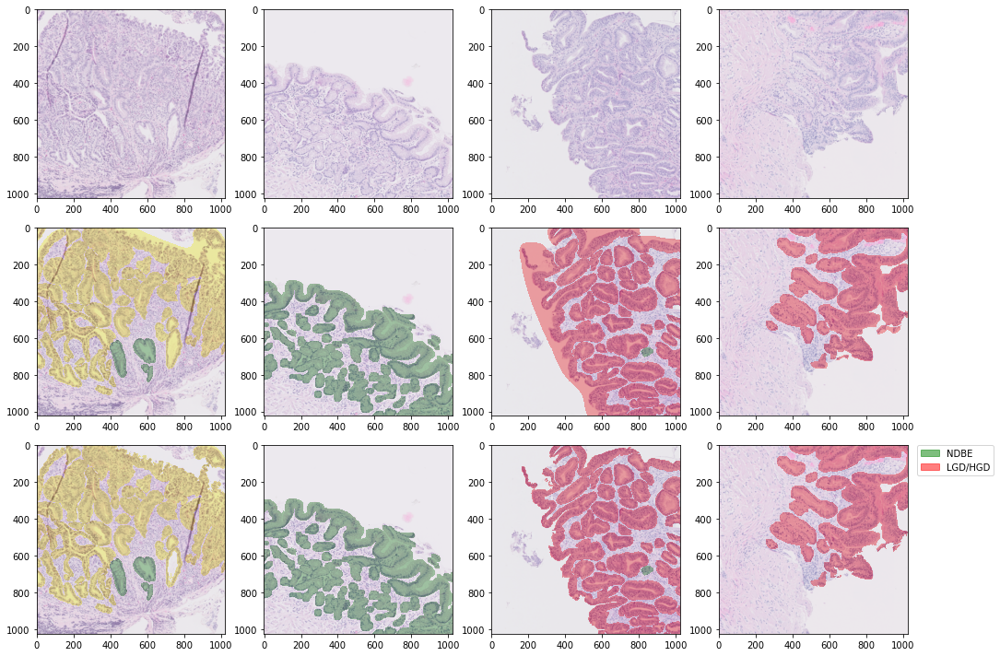

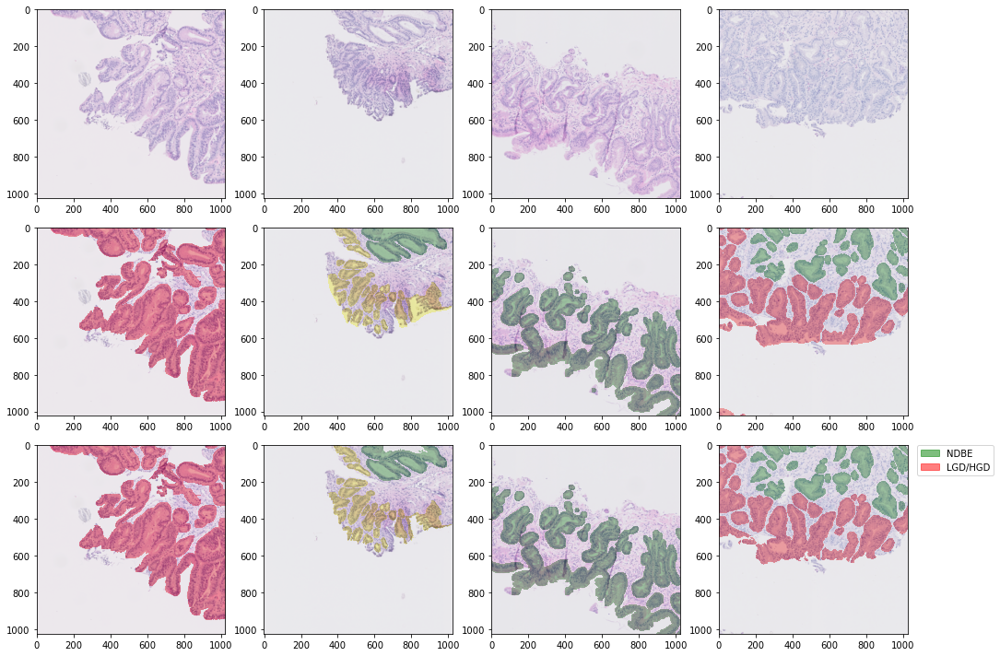

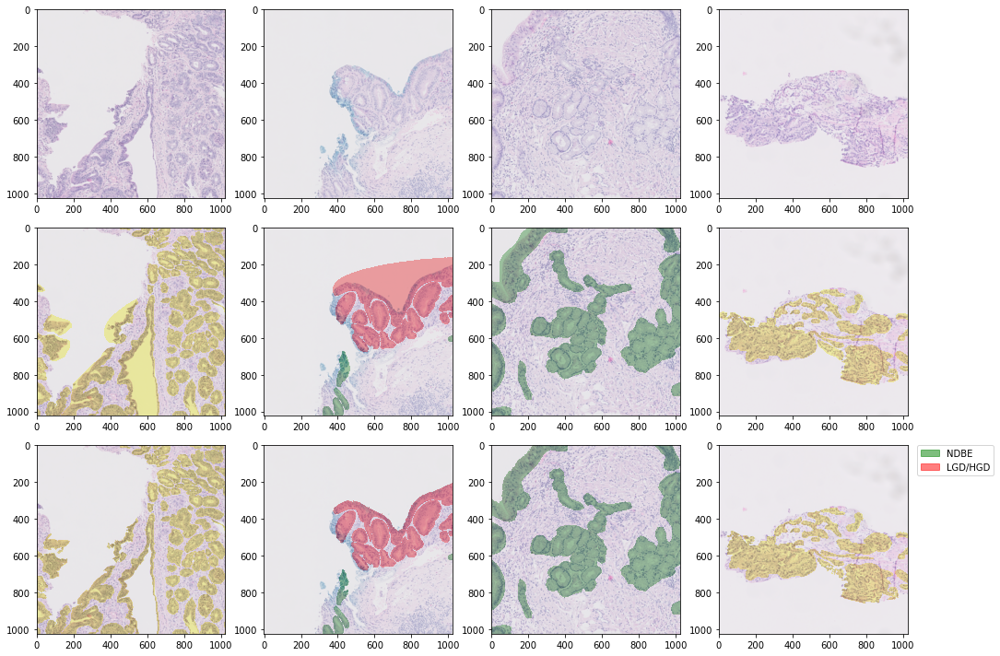

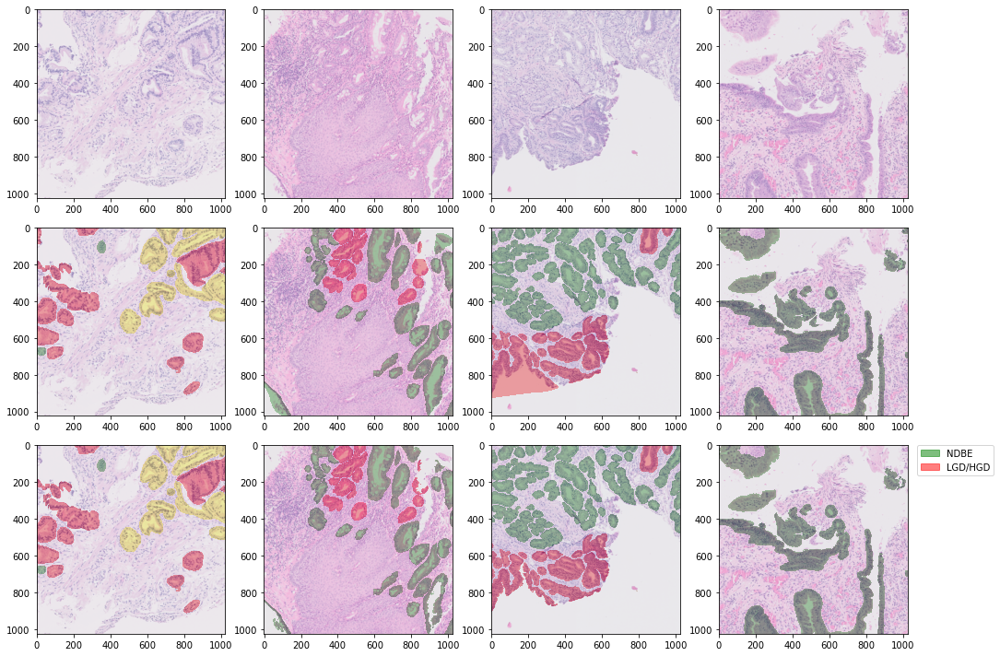

In [20]:
for x, y in batches:
    
    # get filtered batch
    y_m = tissue_mask_batch(x, y, lum_thresh=0.9, size_thresh=5000)
    plot_tissue_masked_batch(x, y, y_m)